In [1]:
import pandas as pd
import numpy as np

df = pd.read_csv('/Users/ray/SQU_Dataset.csv')
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,COLLEGE,College Abbreviation,Course Code,Course Internal Number,Course Short Name,Course Long Name,VERSION,Course Status,DEPARTMENT,English Description,Arabic Description,Course Type,Contact Hours,Course Credits,PREQUISITES,EQUIVALENCES,CO-Requisites
0,College of Medicine & Health Sciences,MED,EPIS6001,16823,Advance Epidemiology,Advanced Principles and Inference Statistics,2,Active,Medical Statistics and Epidemiology,Concepts and uses of epidemiology. Concept of ...,?????? ?????? ??? ?????????? ????? ???????? ??...,"Lecture/Lab (2 hrs lecture, 2 hrs lab)",60,3,EPIS6000,No Equivalences,No CO-Requisites
1,College of Engineering,ENG,ECCE4436,16339,Industrial Control,Industrial Control System Design,2,Active,Electrical and Computer Engineering,Overview on signal processing and conversion: ...,???? ?? ?????? ???????? ??????????. ????? ????...,"Lecture/Lab (2 hrs lecture, 2 hrs lab)",60,3,(ECCE4416 or MCTE4250 or MCTE4450),No Equivalences,No CO-Requisites
2,College of Arts and Social Sciences,ART,GEOG3692,20028,Spatial Analysis,Spatial Analysis,1,Active,Geography,The course aims to provide an in depth underst...,???? ?????? ??? ????? ?????? ???????? ??????? ...,Lecture,45,3,GEOG3593,GGIS4420(2-way),No CO-Requisites
3,College of Law,LAW,PULW1109,15814,Public International,Public International Law,1,Active,Public Law,This syllabus includes definition of the gener...,????? ???? ??? ?????? ????? ??????? ?????? ???...,Lecture,45,3,No Prequisites,No Equivalences,No CO-Requisites
4,College of Arts and Social Sciences,ART,HIST7101,23106,Thesis,Thesis,1,Active,History,The student chooses the topic of his/her resea...,????? ?????? ????? ????? ??????? ?????? ???? ?...,Thesis,15,6,No Prequisites,No Equivalences,No CO-Requisites


In [2]:
print(len(df))

#df['English Description'].fillna(value='Missing', inplace=True)
#df['prereqClass'].fillna(value='Missing', inplace=True)


#df.shape
Description= (df['English Description']).values
Course_Name = (df['Course Long Name']).values
College= (df['COLLEGE']).values
Code=(df['Course Code']).values

4467


In [3]:
import nltk
import re
import os
import codecs
from sklearn import feature_extraction
import mpld3


print (Course_Name[:10])

['Advanced Principles and Inference Statistics'
 'Industrial Control System Design' 'Spatial Analysis'
 'Public International Law' 'Thesis' 'Cell Biology'
 'Principles of Genetics' 'Contrastive Linguistics'
 'Multivariate Techniques' 'Statistics and Research Methods']


In [4]:
# load nltk's English stopwords as variable called 'stopwords'
stopwords = nltk.corpus.stopwords.words('english')

from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [5]:
# here I define a tokenizer and stemmer which returns the set of stems in the text that it is passed

def tokenize_and_stem(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return stems


def tokenize_only(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    return filtered_tokens

In [6]:
totalvocab_stemmed = []
totalvocab_tokenized = []
for i in Description:
    allwords_stemmed = tokenize_and_stem(i) #for each item in 'synopses', tokenize/stem
    totalvocab_stemmed.extend(allwords_stemmed) #extend the 'totalvocab_stemmed' list
    
    allwords_tokenized = tokenize_only(i)
    totalvocab_tokenized.extend(allwords_tokenized)

In [7]:
vocab_frame = pd.DataFrame({'words': totalvocab_tokenized}, index = totalvocab_stemmed)
print ('there are ' + str(vocab_frame.shape[0]) + ' items in vocab_frame')

there are 273899 items in vocab_frame


In [8]:
print (vocab_frame.head())

                    words
concept          concepts
and                   and
use                  uses
of                     of
epidemiolog  epidemiology


In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer

#define vectorizer parameters
tfidf_vectorizer = TfidfVectorizer(max_df=0.5, max_features=200000,
                                 min_df=0.25, stop_words='english',
                                 use_idf=True, tokenizer=tokenize_and_stem, ngram_range=(1,3))

tfidf_matrix = tfidf_vectorizer.fit_transform(Description) #fit the vectorizer

print(tfidf_matrix.shape)

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:388: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['abov', 'afterward', 'alon', 'alreadi', 'alway', 'ani', 'anoth', 'anyon', 'anyth', 'anywher', 'becam', 'becaus', 'becom', 'befor', 'besid', 'cri', 'describ', 'dure', 'els', 'elsewher', 'empti', 'everi', 'everyon', 'everyth', 'everywher', 'fifti', 'forti', 'henc', 'hereaft', 'herebi', 'howev', 'hundr', 'inde', 'mani', 'meanwhil', 'moreov', 'nobodi', 'noon', 'noth', 'nowher', 'onc', 'onli', 'otherwis', 'ourselv', 'perhap', 'pleas', 'sever', 'sinc', 'sincer', 'sixti', 'someon', 'someth', 'sometim', 'somewher', 'themselv', 'thenc', 'thereaft', 'therebi', 'therefor', 'togeth', 'twelv', 'twenti', 'veri', 'whatev', 'whenc', 'whenev', 'wherea', 'whereaft', 'wherebi', 'wherev', 'whi', 'yourselv'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


(4467, 1)


In [10]:
terms = tfidf_vectorizer.get_feature_names()

from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(tfidf_matrix)

print(dist)

[[1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 0. 0. 1.]
 [1. 1. 1. ... 0. 0. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


In [11]:
from sklearn.cluster import KMeans

num_clusters = 9

km = KMeans(n_clusters=num_clusters)

%time km.fit(tfidf_matrix)

clusters = km.labels_.tolist()


CPU times: user 340 ms, sys: 31.3 ms, total: 372 ms
Wall time: 233 ms


<timed eval>:1: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (9). Possibly due to duplicate points in X.


In [12]:
import joblib

#uncomment the below to save your model 
#since I've already run my model I am loading from the pickle

joblib.dump(km,  'doc_cluster.pkl')

km = joblib.load('doc_cluster.pkl')
clusters = km.labels_.tolist()

In [13]:
new_frame= pd.DataFrame()
new_frame["Code"]=Code
new_frame["Title"]=Course_Name
new_frame["Description"]=Description
new_frame["College"]=College
new_frame["Cluster"]=clusters

new_frame.head()

,Code,Title,Description,College,Cluster
0,EPIS6001,Advanced Principles and Inference Statistics,Concepts and uses of epidemiology. Concept of ...,College of Medicine & Health Sciences,1
1,ECCE4436,Industrial Control System Design,Overview on signal processing and conversion: ...,College of Engineering,1
2,GEOG3692,Spatial Analysis,The course aims to provide an in depth underst...,College of Arts and Social Sciences,1
3,PULW1109,Public International Law,This syllabus includes definition of the gener...,College of Law,0
4,HIST7101,Thesis,The student chooses the topic of his/her resea...,College of Arts and Social Sciences,1


In [14]:
new_frame['Cluster'].value_counts() #number of films per cluster (clusters from 0 to 4)


1    3226
0    1241
Name: Cluster, dtype: int64

In [15]:
from __future__ import print_function

print("Top terms per cluster:")
print()
#sort cluster centers by proximity to centroid
order_centroids = km.cluster_centers_.argsort()[:, ::-1] 

for i in range(num_clusters):
    print("Cluster %d words:" % i, end='')
    
    for ind in order_centroids[i, :6]: #replace 6 with n words per cluster
        print(' %s' % vocab_frame.loc[terms[ind].split(' ')].values.tolist()[0][0].encode('utf-8', 'ignore'), end=',')
    print() #add whitespace
    print() #add whitespace
    
    print("Cluster %d titles:" % i, end='')
    for title in Course_Name:
        print(' %s,' % title, end='')
    print() #add whitespace
    print() #add whitespace
    
print()
print()

Top terms per cluster:

Cluster 0 words: b'includes',



Cluster 0 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Molecular Diagnostics, The Uro-reproductive System, An Introduction to Arabic Language and Literature, English Language for Law (1), General Chemistry (1), Optional Instrument Performance (1), Criminal Law (General Part), Arabic Dialects, Supply Chain Management, Optional Instrument Performance (8), Interpretation Industry in Tourism, Employee Training and Development, Quantitative Techniques for Decision Making in Agricultre, Reliability Engineering, Coaching Principles, Research Methodology in Computer Science, Object Oriented Programming, History of the Ancient Near Eastern Civilization, Geodesy and Map Projection, Lexicography and Terminology, Journalism Applications, Sociology of Organization, Seminar in Management, Power System Protection, Chemical  Engineering Lab (1), English for Nutrition and Dietetics, Maternal Health Nursing / Clinical, Comparative Constitutional Judiciary, Profound Study of International Laws Dispute and Juridical Speciality, Co-Operative Training-II, Math

 Geography of Co-Operation Council (GCC) Countries, International  Laws of  Seas, Principle of Mass Media Research, Islamic Education through English, Introduction to Education, Omani Traditional Music and Rhythms, Veterinary Immunology, Organizational Development, International Communications, Law of Arbitration, Applied Mycology, Facilities Design and Planning, Social Studies Studies Through English, Microgrids and Smart Grid, Communication and Group Dynamics, Applied Physical Geography, Seed Production, Introduction to Interpreting (2): Arabic -English, Intermediate Finance, Desalination Processes, Play in Early Childhood Stage, Intermediate Statistics for Business and Economics, Environmental Systems, PhD Thesis, Special Topic in Literature, Urban Environmental Design, Membrane Technology for Water and Wastewater, Seminar in Radio and Television, Play Writing, Animal Science Special Problems, Special Topic in Public Relations and Advertising, International Law and Organizations, Ad

Cluster 1 words: b'includes',



Cluster 1 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Archaeological Terminology in English and Report Writing, European History and Civilization in the Middle Ages, Advanced Diagenesis and Sedimentary Geochemistry, Masters Thesis, Managing Leisure and Sport Tourism, Seminar in Omani Journalism, Electrical Machines, Parallel Computing, Business Law, PhD Thesis, Combinatorics, Mobile Application Development, Functional Foods, Research Seminar in Measurement, Educational Psychology, Environmental Indicators in Oman, Title Design and Implementation of Social Research (2), Arabic Morphology, Graduation Project, Calculus (1), Structures (2), Veterinary Imaging and Anesthesiology, Mass Media and Society (UE), Current Issues in Tourism and Hospitality Labor Market, Tourism Accounting, Architectural Design (3): Complex Multi-Function, IT Infrastructure, General Biology (1), Security in the Gulf Region, Professional Practice  in Social Work, PhD Thesis, Health Assessment with Laboratory, Newspaper's Design and Layout, Profound Study of  Administr

 The Contemporary Islamic World, Web Services, Modern Literary Criticism, Thesis, Fundamentals of Medicinal Chemistry and Drug Design, Nanocomposities Engineering Materials, Sustainable Manufacturing Systems,  Global and Oman health care priorities, Aquaculture Development and Management of Its Environmental Impact, Investigation of Endocrine Diseases, Topics in Nanobiotechnology, Media and Society, Thesis, The History of Maghrib and Al-Andalus, Advanced Instrumental Analysis, Introduction to Special Education, Introduction to Law, Basics of Scientific Research, Operations Research (2), Intermational Economic Development, Locations Methods, Advanced Transport Phenomena, Nuclear Applications, Fieldwork with Pre-schoolers (2), German for Beginners 2 (UE), Python Programming for Everyone, Theatre and Society, Introduction to Mass Communication, Public Finance and Taxes System, Semantics, Residential Planning and Design, Economics of Education, Modern History, Adult Health Nursing (1)/ Cli

Cluster 2 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 IT Infrastructure, General Biology (1), Security in the Gulf Region, Professional Practice  in Social Work, PhD Thesis, Health Assessment with Laboratory, Newspaper's Design and Layout, Profound Study of  Administrative Judiciary, Nutritional Toxicology, Shakespeare, Technology for Learning, Reservoir Geophysic, Research Project (2), Business Mathematics (1), Translation Critique, Translation: Commercial and Advertising, Power System Operation & Control, Art Crafts, Estimating Construction Cost, Mathematics for College of Commerce and Economics 3 (Arts), Crimes Against State's Security, English Reading for Library and Information Science 2, Special Topics in Mathematics I, Principles of Cytopathology, Environmental Site Assessment and Remediation, Computational Techniques in Statistics, Clinical Placement, Physics for Biomedical Sciences, Commercial Paper, Petroleum Refining, Advertising Design and Production, Design Instruction Software and Games for Children, Communication Systems, 

 Introduction to Mass Communication, Public Finance and Taxes System, Semantics, Residential Planning and Design, Economics of Education, Modern History, Adult Health Nursing (1)/ Clinical, Communication Research, Law of Electronic Transactions, Principles of Research Methods in Information Systems, Sport's Health, Physique, Educational Curriculum (Islamic Education), Population Growth: (Fertility, Mortality, and Migration), Heterogeneous Catalysis and Reactor Design, Population and Development, Managing a Growing Business, International Organisiations, Management and Leadership in Sports, Sociology of Development, Recitation and Memorization, Qualitative Research, Crop Physiology, Microwave Remote Sensing, Introduction to Partial Differential Equations, Engineering Geology, Wastewater Treatment, Sea World (Arabic) (UE), Building Illumination, Desalination, Architectural Design Theory, Computer Application in Education, Principles of Epidemiology, Communication Skills for Tourism Engli

Cluster 3 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Geographic Information Systems in Water Resources, Construction Planning & Scheduling (Computer application), Advanced Social Statistics, Oman's Archaeology, English for Education Technology, Creative Drama in the Classroom, Biological Conservation, Physical Chemistry (1), Expressive Arts, Specialized Journalism, Educational System and Administration in Oman and the Gulf States, Cellular Communication and Introduction to Drug Action, Adventure Tourism, Introductory Management Accounting, Prophet's Stories, Hydropedology for Soil-Water-Lancdscape Interactions, Culture Issues in Contemporary Societies, English Language Skills, Biochemical Engineering, Methods of Teaching Art Education (2), Multivariate Statistical Methods, Post - harvest Physiology, Contemporary and Modern History of the Arab World, Introductory Microbiology, French for Tourism (5), Planning and Production of Brodcasting Programs, Numerical Analysis, Engineering Economic Decision Analysis, Music Basic Instrument Perform

 Research Project in Arabic Language Curriculum and Instruction, Item Response theory, Introduction to Environmental Science, User Studies, Electronics Communication Circuits, FPEH Intensive English Language Course, Readings in Modern Arabic Literature, Physiology of Fruit Trees, English for Musicology (1), Irrigation Principles, Orientalism and the Arab Islamic History, Small Business Management, Theoretical Methods of Physics (1), Animal Reproductive Physiology, Nutrition in Wellness and Illness, Surveying and Global Positioning Systems, Family,School and Community, Systems Quality Assurance, Geophysics Project-I, Educational Administration, Desalination and Water Treatment Technology, Linear Algebra (2), Educational and Information Technology, Chemical Process Safety, Architectural Design (1): Basic Design, Applied Programming and Algorithms for Engineers, Applied Pharmacology for Medical Students, Descriptive Inorganic Chemistry, Rules of Islamic Waqf, FPES Intensive English Langua

Cluster 4 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Numerical Analysis, Engineering Economic Decision Analysis, Music Basic Instrument Performance (Piano) 7, Cognitive Psychology, Diversity in Modern Society (UE), Profound Study of  Administrative Law, Social Policy and Social Planning, Introduction to Geophysics, Experimental Techniques in Physics, Foundations of Mathematics, Biology Project (2), Co-Operative Training-I, Measurements and Instrumentation, Contemporary School Management, Solid State Theory, Methods of modern literary criticism, Independent Study in Economics, Chemical Sensors, Immunology, Product design and Manufacturing, Pressure Vessels and Piping System Design, Theatrical Appreciation (UE), Internet for Learning Resource Centers Specialists, Systems and Networks Programming, Topics in contemporary linguistics, Technology of Journalism and Electronic Publishing, Legal Professions Moralities, Oman and Islamic Civilization, Food Chemistry (1), Engineering Design, Food Sanitation and Quality Control, PhD Thesis, Gemstone

 Descriptive Inorganic Chemistry, Rules of Islamic Waqf, FPES Intensive English Language Course (Only Summer ), Master thesis, Physics Project I, Warehousing and Distribution Management, Clinical Chemistry Project, New Trends in Electrical Machines Technology, Department Practical Elective Swimming, Sensory Evaluation of Food, Financing Events, Natural and Cultural Heritage, GIS for Environmentalists, General Biology (2), Marketing Management, Special Topic in Linguistics, Planning of Infrastructure and Services, Introduction to Metric Spaces, Social Work in Health Services, Business of Banks and Financial Institutions, Personality Development (UE), Advanced Statistics in Psychology 1, Mathematics Curriculum and Methods of Teaching in Schools, Digital Signal Processing, Working Capital Management, Readings in Contemporary Linguistics in English Language, Sustainable Architectural Design in Hot Regions, Simulation Modeling ang Analysis, Knowledge Economics and Information Marketing, Met

Cluster 5 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Oman and Islamic Civilization, Food Chemistry (1), Engineering Design, Food Sanitation and Quality Control, PhD Thesis, Gemstones ( Arabic ) (UE), Graduation Project in Environment, Geomorphology, English Language Skills for Graduate Studies, Positive Psychology for Children with Disabilities and their Families (UE), MASTER THESIS, Solfeggio and Theory of  Western Music (1), FPEL Intensine English Course (Only Summer ), Veterinary Microbiology, Conventions and Meeting Management, Basic English Reading Skills, JAVA Programming, Surface Chemistry and Surface Analysis, PhD Thesis, Foundations of Islamic Jurisprudence, Research Methods in Organizations, The Ayyubides and Mamlouks, Programming for Engineers, Field Mapping Techniques, Advanced Time Series Analysis, Drawing (1), Introduction to Educational Technology, Seminar in Human Resource Management, Landscape Plant Management, General Physics (1), PhD Thesis, Harmony (4), PhD Thesis, Reading and Vocabular (1), Classroom Measurement and

 Sustainable Architectural Design in Hot Regions, Simulation Modeling ang Analysis, Knowledge Economics and Information Marketing, Methods of Teaching Social Studies, Legal Issues and Information Ethic, Fundamentals of Family Business, Theories and Practices in Educational Planning, Principles of Agricultural Machinery, Thesis Part I, Research Methods in Information Studies, Veterinary Technology Intership, Organisational Behaviour in Educational Institutions, Health Assessment /Laboratory, Diagnosis and Assessment in Special Education, Adult and Continuing Education, Recitation and Memorization of the Holy Quran, Managing Social Welfare Organization, Macroeconomics Policy and Natural Resources, Fisheries Internship/Work Experience, Food Packaging, Petroleum Geology, Commercial Bankruptcy in  English Language, Cellular Pathology, Design of Masonry Structures, Auditing, From Neuron to Behavior, Microbiology and Immunology, Child Guidance in the Educational Environment, Evolution of Mode

Cluster 6 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Introduction to Educational Technology, Seminar in Human Resource Management, Landscape Plant Management, General Physics (1), PhD Thesis, Harmony (4), PhD Thesis, Reading and Vocabular (1), Classroom Measurement and Evaluation, GIS Management, Animal Health, Survey Design and Sampling, Comparative Political Intellect Principles, Administrative Law, Circuit Analysis (1), English Language and Academic Skills for Post Graduate Students, Plant Stress Physiology, Automated Industrial Systems, Introduction to Crop Production, Chemistry for Medicine, Management Information Systems, Roles in Advanced Nursing Practice, Word Formation and Morphology, General Methods of Teaching, Studies in Shakespeare (UE), General Chemistry for Engineering, Indexing and Abstracting, Graphic Design (1), Groundwater Hydraulics, Architectural Professional Practice, Using Computer in Libraries and Information, Anatomy and Histology of Farm Animals, Religion and Politics, Social Studies's Curriculum, Library of Co

 Child Guidance in the Educational Environment, Evolution of Modern Day Medicine (UE), Sensors and Actuators, Contemporary Visual Arts (UE), Theories in Nursing, Introduction to Java, Techniques in Sequence Stratigraphy, World Drama : The Most Important Artistic, Literary, and Intellectual Movements, Classroom Assessment, Environment and Society, Social Policies and Planning Social Work, Origins and Sources of Islamic Legisilation, Motor Learning, Applied Sociology, Innovation and Entrepreneurship, Laboratory Rotation, Contemporary Strategic Issues, Environment Law, Chemistry Project, Advanced Wireless and Mobile Networks Security, Counselling and Social Psychology, Human Rights and Freedom, Municipal Distribution and Collection Systems, Theatre Adaptation, Information Systems Analysis and  Design, Theories and Strategies of Couple and Family Counseling, School Counseling, Inventory Management, Enzymology and Metabolism, Organic Chemistry (2), FPES Intensive English Language Course, Re

Cluster 7 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Robotics, Contemporary Issues in Health, Nutrition and Sport, Physics For Engineering (1), Introduction to Computer Aided Architectural Design, Introduction to Sports Psychology, Higher Education Policies, Public Function, Igneous Petrology, Islamic Jurisprudence of Financial Transactions, Meat Science, Transport of Chemicals in Porous Media, Introductory Applied Mechanics, Methods of Teaching Science (1), The Management of Natural Resource Project, Child's Theatre (UE), Integer and Stochastic Optimization in Practice, Molecular Diagnosis, Art's Curriculum, Unit Operations (1), Growth and Development, Project in Intelligent Systems and Data Science, Industrial Inorganic Chemistry, Modern Physics, Seminar, Methods of Teaching Islamic Education, Period Study, Probability, Man and Natural Environments in Oman (UE), Instrumentation, Product Design, Medical parasitology, Design and Implementation of Social Research (1), Introduction to Archaeology, Mechatronics System Design, Floriculture,

 School Counseling, Inventory Management, Enzymology and Metabolism, Organic Chemistry (2), FPES Intensive English Language Course, Research Methods in Information Studies, Documentary Programs, Geophysics Project, Design Applications, Farm Practicum, Hydrocarbon Play and Prospect Assessment, Geography of Rural Settlements, Advanced Numirical Analysis, Arabic Skills for Translators, MSc Project in Statistics, Field Geophysics, Educational Psychological Measurement and Evaluation, Integrated subsurface and surface analysis, Quran Recitation (UE), PRINCIPLES OF LEAN OPERATIONS, Psychological and Educational Measurement, Airport Design, Adult Health Nursing (2), The Internet for Medical Professional, Mineral Resources Management, Classical Literature, Leadership in Organization, Playwriting: Writing Microdrama, GIS and RS Applications in Planning, Environmental Economics, IT Applications for Hospitality, Bioactive Secondary metabolites, Rock Art in Oman, Periodical and Government Publicat

Cluster 8 titles: Advanced Principles and Inference Statistics, Industrial Control System Design, Spatial Analysis, Public International Law, Thesis, Cell Biology, Principles of Genetics, Contrastive Linguistics, Multivariate Techniques, Statistics and Research Methods, Children's Literature, Social Psychology, IT Security Risk Management and Countermeasures, PhD Thesis, Mathematics Education Through English, Web Security, Virtual Libraries, Power Units, Tillage and Soil Machine Relationships, Meat Hygiene and Abattoir Practice, Interpretation Planning, Co-Operative Training-II, Quantitative Techniques for Geography, Advanced Fluid Mechanics, Advanced Concrete Structures, Islamic and Umayyad Literature, Advanced Clinical Nursing / Graduation Project, Developmental Psychology, Management of Learning Resource Centers, Adult Health Nursing (1)/ Clinical, Social Entrepreneurship, Language Skills for Law, Study of Human Behaviour (UE), Information Literacy (UE), Special Topics in Mathematic

 Differential Equations for Engineers, Physical-Chemical Treatment Processes, Technology and Project Management, Curriculum Theory, Design and Development, History of Arabic Music (2), Satellite Oceanography, Agricultural Extension Methods and Techniques, Marine Ecosystem Modeling, Protocol and Organizing Events, Solfeggio and Theory of  Arabic Music (1), Archaeology of Oman During The Islamic Periods, Principles of the Commercial Law, Physical Chemistry (2), Project, Intermediate Management Accounting, Volleyball, Magnetism, Control of Electric Drives, Art Curriculum Design and Development, Learners with Special needs, Electronics, Biological Effects of Radiation, Geography of the Arab World, International Human Resource Management, Secondary and Enhanced Oil Recovery, Seminar in Management: Special Topics and Readings, Natural Language Processing, Statistical Methods, Statistical Physics, Creative Writing, Security Analysis and Portfolio Management, Embedded Vision Systems, Regional 

 Number Theory, Maternal Health Nursing, Current Issues in Finance, Statistical Analysis in Urban Planning, Advanced Health Assessment, Basic Mechanics, Comparative Politics of the West, Issues in Library and Information Science in the Arab Gulf States, Productivity Analysis and Management, Advances in Postharvest Technology, Forages and Pastures, Special Topics in IE, Fundamentals of Programming in Business, Introduction to Nanotechnology Engineering, Edutainment with Robots (UE), Architectural Drawing, Insect Resistance in Crop Plants, Subject Analysis, Mechatronics, Benefit Cost Analysis, Principles of Marketing, Criminal Judgements Execution, Diagnostic Imaging and Anesthesiology, Programmable Logic Control Systems, Measure Theory, Computational Methods of Physics, Special Topics in Physics (2), Approaches to Hadith Analysis, The History of Science and Research Methods, Practicum in Higher Education Administration, Introductory To Computational Physics, Basic Mathematics in English

 Introduction to Engineering, Project (1), Optimal Experimental Design, Science and Science Education (UE), Instructional Computer Programming (1), Graduation Project (1), PhD Thesis, Building Mechanical Systems, Summer Training, Information and Communication Technology, Algorithms and Complexity, Theory and Practice in Group Counseling, Money and Banking, Basic Mathematics with Computers ( English ), Laboratory Management and Quality Assurance, Food Science and Nutrition Project, Investment Law, Epidemiology in Health Care Planing, Weeds and their Control, Computer Aided Lighting Design, An Introduction to Persian Literature (UE), History of Social and Legal Institons, Parent Education, Advanced Java Programming, Special Topics in Marketing, Pre-Clerkship, Introduction to Education, Applied Sociology, Information Services, Sports Physiology, Plant and Process Design, Pathogenesis of bacterial infections in Animals, Research Project in Arabic Language Curriculum and Instruction, Item R

In [16]:
#set up colors per clusters using a dict
cluster_colors = {0: '#1b9e77', 1: '#d95f02', 2: '#7570b3', 3: '#e7298a', 4: '#66a61e', 5:'#FFD1DC',  6:'#00abff' , 7:'#cc0031',  8:'#5c303b'}

#set up cluster names using a dict
cluster_names = {0: 'Cluster 0', 
                 1: 'Cluster 1', 
                 2: 'Cluster 2', 
                 3: 'Cluster 3', 
                 4: 'Cluster 4',
                 5: 'Cluster 5',
                6: 'Cluster 6',
                7: 'Cluster 7',
                8: 'Cluster 8',}

In [17]:
import os  # for os.path.basename

import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.manifold import MDS

MDS()

# convert two components as we're plotting points in a two-dimensional plane
# "precomputed" because we provide a distance matrix
# we will also specify `random_state` so the plot is reproducible.
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

pos = mds.fit_transform(dist)  # shape (n_components, n_samples)

xs, ys = pos[:, 0], pos[:, 1]
print()
print()

/Applications/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Applications/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


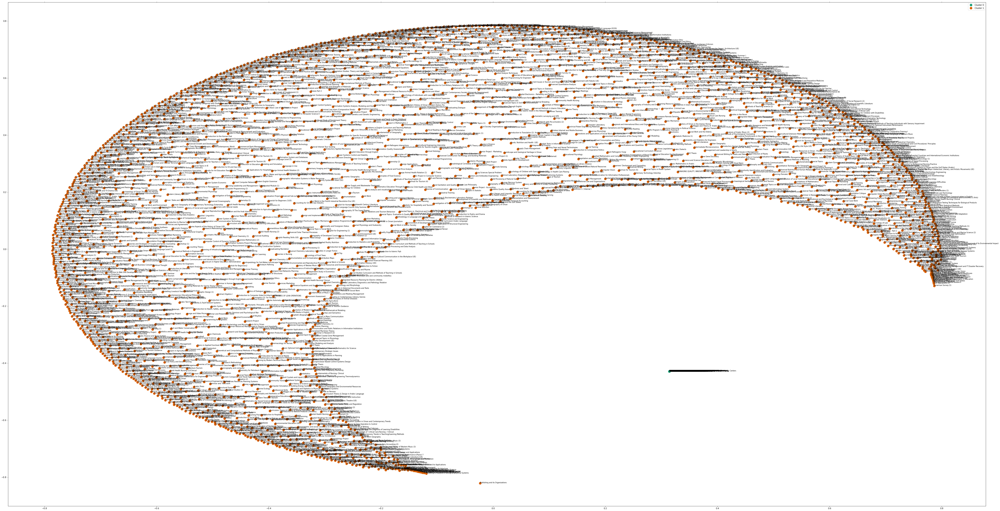

In [18]:
#some ipython magic to show the matplotlib plots inline
%matplotlib inline 

#create data frame that has the result of the MDS plus the cluster numbers and titles
df2 = pd.DataFrame(dict(x=xs, y=ys, label=clusters, title=Course_Name)) 

#group by cluster
groups = df2.groupby('label')


# set up plot
fig, ax = plt.subplots(figsize=(85,45)) # set size
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=12, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  #show legend with only 1 point

#add label in x,y position with the label as the film title
for i in range(len(df2)):
    ax.text(df2.loc[i]['x'], df2.loc[i]['y'], df2.loc[i]['title'], size=8)  

    
    
plt.show() #show the plot

#uncomment the below to save the plot if need be
#plt.savefig('clusters_small_noaxes.png', dpi=200)

RecursionError: maximum recursion depth exceeded while calling a Python object

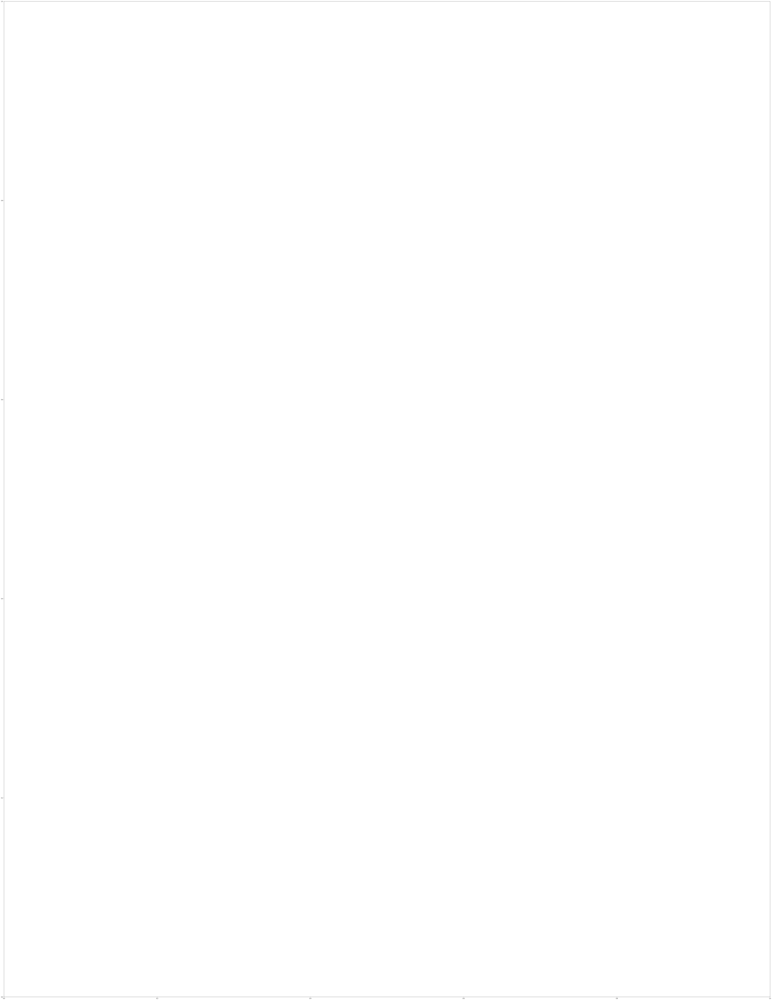

In [19]:
from scipy.cluster.hierarchy import ward, dendrogram

linkage_matrix = ward(dist) #define the linkage_matrix using ward clustering pre-computed distances

fig, ax = plt.subplots(figsize=(105, 140)) # set size
ax = dendrogram(linkage_matrix, orientation="right", labels=Course_Name);

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')

plt.tight_layout() #show plot with tight layout

#uncomment below to save figure
plt.savefig('ward_clusters.png', dpi=200) #save figure as ward_clusters